# Setup

In [1]:
import yaml
import pathlib
import sys
sys.path.insert(1, "/Users/ian.convy/code/mmvaeplus/src")

import torch
from torchvision.utils import make_grid
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

import utils
from data import MET_Data, get_transformation_function

import models

In [2]:
polymnist_data = MET_Data("../../data/polymnist.hdf5", m0 = "m0", m1 = "m1", m2 = "m2", m3 = "m3", m4 = "m4")
cub_data = MET_Data("../../data/cub.hdf5", images = "images", captions = "captions")

In [3]:
polymnist_model = utils.load_jit_folds("../../results/polymnist/vae_32_fixed")
cub_model = utils.load_jit_folds("../../results/cub/64_recon_100")

In [4]:
mm_polymnist_path = "/Users/ian.convy/code/mmvaeplus/outputs/PolyMNIST_fold_1/checkpoints/32_32_2.5_2/model_25.rar"
mm_polymnist_args = torch.load("/Users/ian.convy/code/mmvaeplus/outputs/PolyMNIST_fold_1/checkpoints/32_32_2.5_2/args.rar")
mm_cub_path = "/Users/ian.convy/code/mmvaeplus/outputs/CUB_fold_1/checkpoints/16_48_1.0_2/model_10.rar"
mm_cub_args = torch.load("/Users/ian.convy/code/mmvaeplus/outputs/CUB_fold_1/checkpoints/16_48_1.0_2/args.rar")

mm_polymnist_model = models.MMVAEplus_PolyMNIST_5modalities(mm_polymnist_args)
mm_polymnist_model.load_state_dict(torch.load(mm_polymnist_path, map_location = torch.device("cpu")))
mm_cub_model = models.MMVAEplus_CUB_Image_Captions(mm_cub_args)
mm_cub_model.load_state_dict(torch.load(mm_cub_path, map_location = torch.device("cpu")))

<All keys matched successfully>

# PolyMNIST

In [5]:
fold = 1
polymnist_vae = polymnist_model["folds"][fold]["best"]
polymnist_test = polymnist_model["folds"][fold]["test_ids"]

## Qualitative

In [6]:
modal_maps = [("A", "m0"), ("B", "m1"), ("C", "m2"), ("D", "m3"), ("E", "m4")]
test_data = polymnist_data.get_specimens(polymnist_test)
is_mm_test = test_data["train_test"] == "test"
samples = np.random.choice(100, size = 10, replace = False)

### Reconstruction

In [9]:
images = []
for (i, index) in enumerate(samples):
    modal_index = i % 5
    (modal, form) = modal_maps[modal_index]
    img = test_data[form][is_mm_test][index:index+1]
    img_recon = polymnist_vae({form: torch.from_numpy(img).float()}, modal, [modal])[modal][form].numpy(force = True)
    mm_recon = mm_polymnist_model.vaes[modal_index].reconstruct(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous()).squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img, img_recon, mm_recon[None]]
    images.append(recon_arrs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


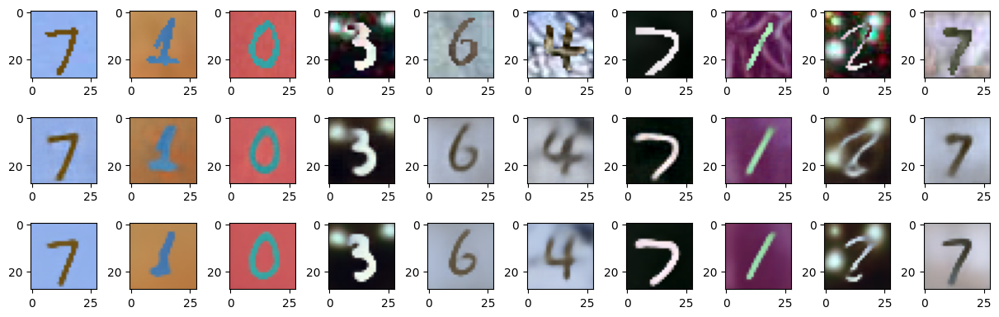

In [10]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


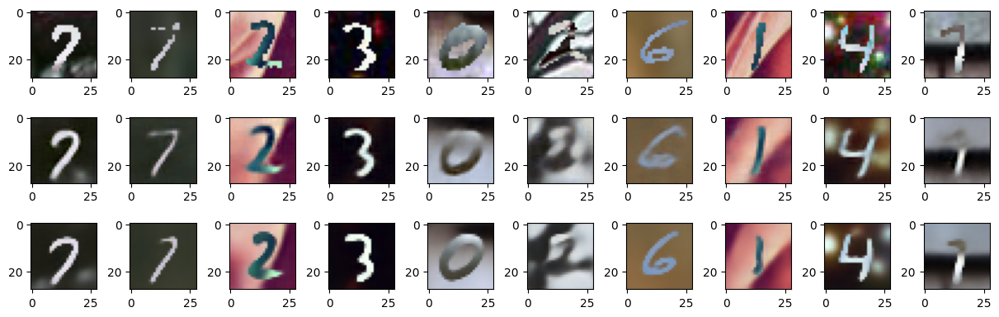

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


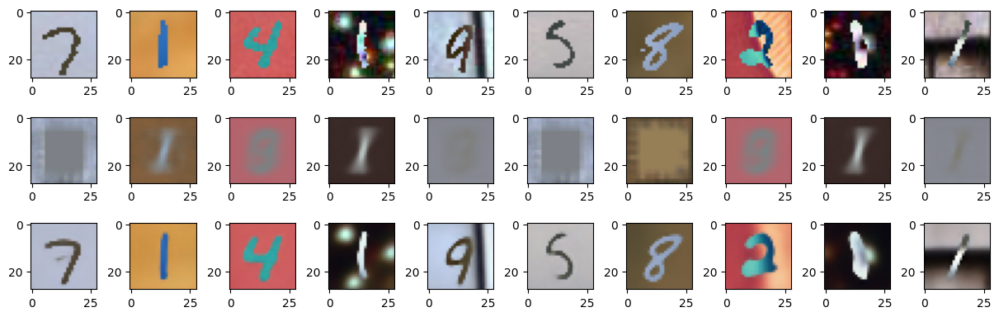

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


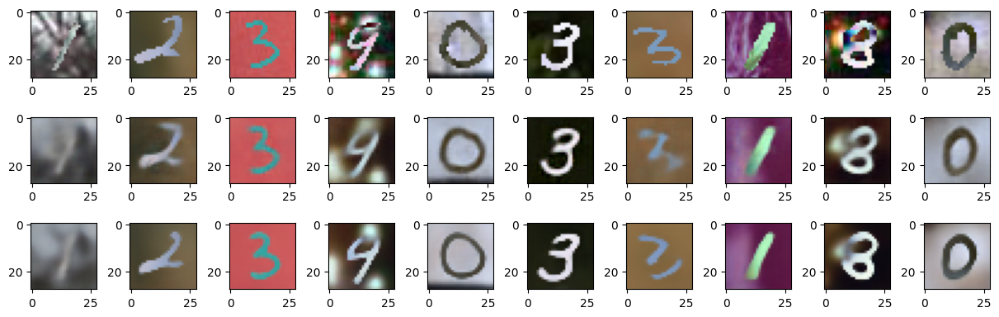

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


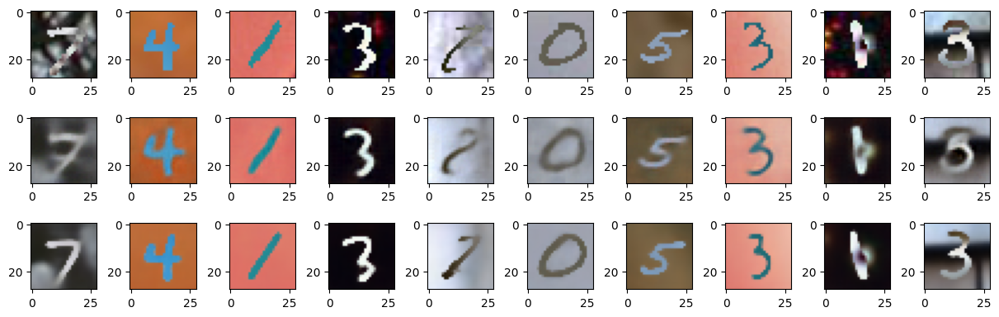

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

### Cross-modal Generation

In [13]:
images = []
for (input_index, (modal_1, form_1)) in enumerate(modal_maps):
    img = test_data[form_1][is_mm_test][0:1]
    img_recons = polymnist_vae({form_1: torch.from_numpy(img).float()}, modal_1, [modal for (modal, _) in modal_maps])
    input_mm_vae = mm_polymnist_model.vaes[input_index]
    mm_z = input_mm_vae(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[0].mean[None, :, 32:]
    images.append([img])
    for (output_index, (modal_2, form_2)) in enumerate(modal_maps):
        if modal_1 != modal_2:
            output_mm_vae = mm_polymnist_model.vaes[output_index]
            mm_w = torch.zeros_like(mm_z) #mm_polymnist_model.pw(*mm_polymnist_model.pw_params).sample(mm_z.shape[:2]).squeeze(2)
            mm_latent = torch.cat([mm_w, mm_z], -1)
            mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().permute(1, 2, 0).numpy(force = True)
            img_recon = img_recons[modal_2][form_2].numpy(force = True)
            recon_arrs = [img_recon, mm_recon[None]]
            images[-1].append(recon_arrs)
        else:
            images[-1].append(None)

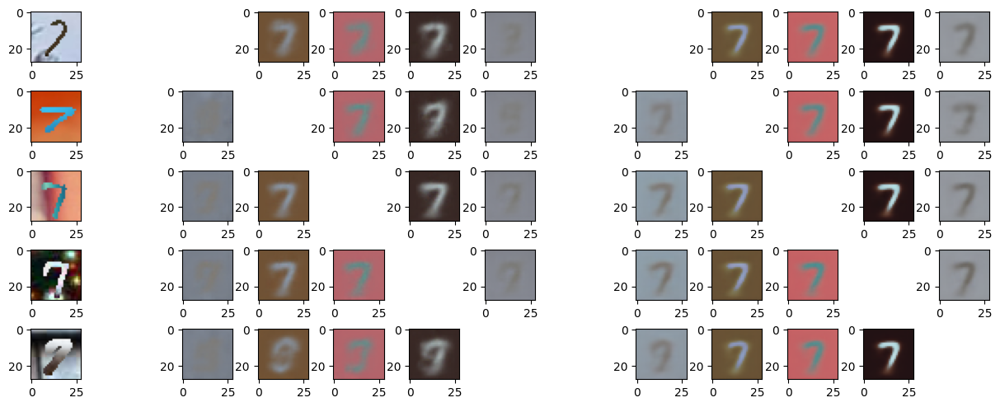

In [14]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(5, 13, wspace = 0.5, hspace = -0.75)
for (modal_1_index, modal_list) in enumerate(images):
    orig = modal_list[0]
    fig.add_subplot(grid_spec[modal_1_index, 0]).imshow(orig[0])
    for (modal_2_index, img_list) in enumerate(modal_list[1:]):
        if img_list is not None:
            (recon, mm_recon) = img_list
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2]).imshow(recon[0])
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2 + 6]).imshow(mm_recon[0])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


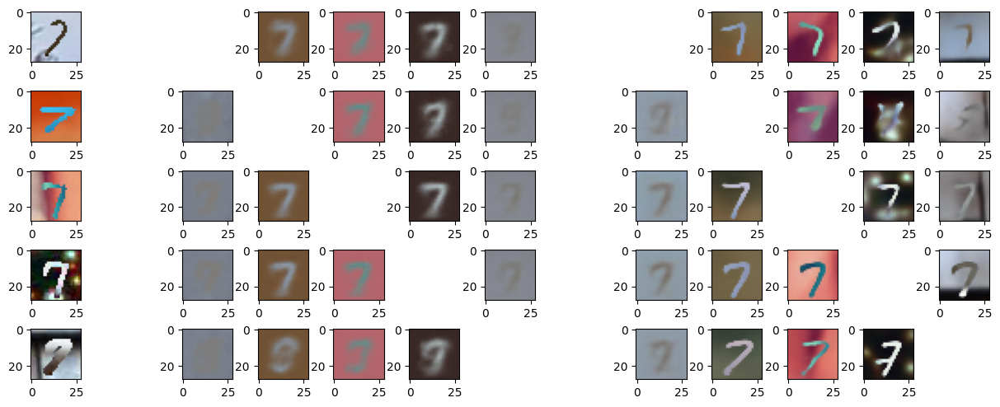

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(5, 13, wspace = 0.5, hspace = -0.75)
for (modal_1_index, modal_list) in enumerate(images):
    orig = modal_list[0]
    fig.add_subplot(grid_spec[modal_1_index, 0]).imshow(orig[0])
    for (modal_2_index, img_list) in enumerate(modal_list[1:]):
        if img_list is not None:
            (recon, mm_recon) = img_list
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2]).imshow(recon[0])
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2 + 6]).imshow(mm_recon[0])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


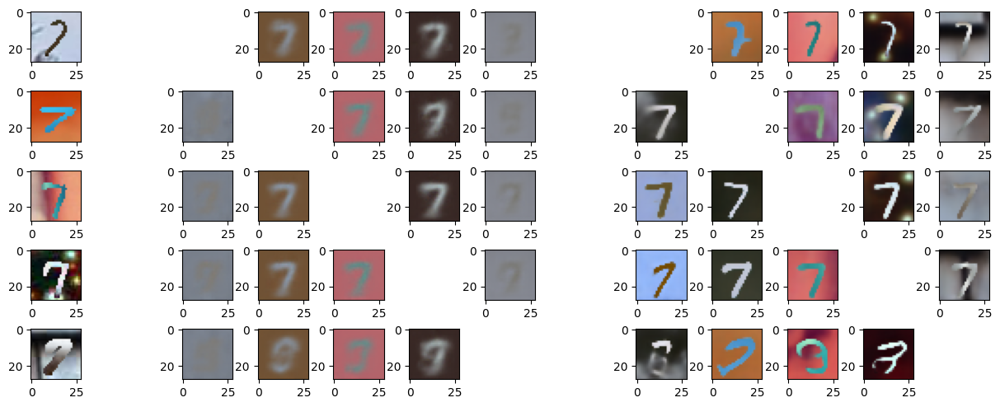

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(5, 13, wspace = 0.5, hspace = -0.75)
for (modal_1_index, modal_list) in enumerate(images):
    orig = modal_list[0]
    fig.add_subplot(grid_spec[modal_1_index, 0]).imshow(orig[0])
    for (modal_2_index, img_list) in enumerate(modal_list[1:]):
        if img_list is not None:
            (recon, mm_recon) = img_list
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2]).imshow(recon[0])
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2 + 6]).imshow(mm_recon[0])
plt.show()

### Unconditional Generation

In [ ]:
sampled_z = torch.randn([10, 32])
generated = [[polymnist_vae.model_dict[modal]["dec"](z[None])[form].numpy(force = True) for z in sampled_z] 
             for (modal, form) in modal_maps]
grids = [make_grid([torch.as_tensor(img[0]).permute(2, 0, 1) for img in img_list], nrow = 3).permute(1, 2, 0) for img_list in generated]
mm_grids = [arr.permute(1, 2, 0) for arr in mm_polymnist_model.generate_unconditional(10)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


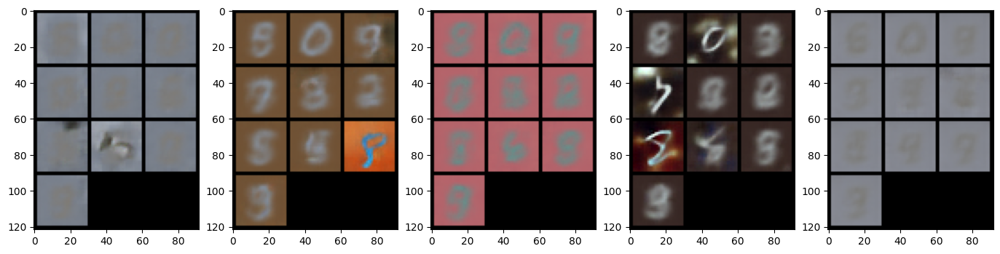

In [ ]:
fig = plt.figure(figsize = (17, 10))
grid_spec = fig.add_gridspec(1, 5, wspace = 0.2, hspace = -0.5)
for (i, img) in enumerate(grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


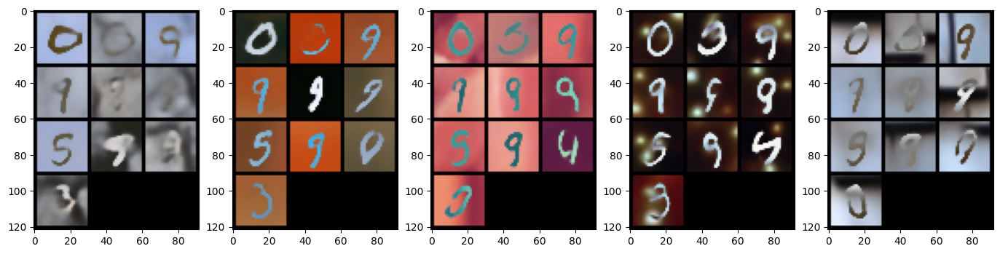

In [ ]:
fig = plt.figure(figsize = (17, 10))
grid_spec = fig.add_gridspec(1, 5, wspace = 0.2, hspace = -0.5)
for (i, img) in enumerate(mm_grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

# CUB

In [54]:
fold = 1
cub_vae = cub_model["folds"][fold]["best"]
cub_test = cub_model["folds"][fold]["test_ids"]

## Qualitative

In [55]:
modal_maps = [("A", "images"), ("B", "captions")]
test_data = cub_data.get_specimens(cub_test)
is_mm_test = test_data["train_test"] == "test"
samples = np.random.choice(100, size = 10, replace = False)

### Reconstruction

In [56]:
images = []
for (i, index) in enumerate(samples):
    (modal, form) = ("A", "images")
    img = test_data[form][is_mm_test][index:index+1]
    img_recon = cub_vae({form: torch.from_numpy(img).float()}, modal, [modal])[modal][form].numpy(force = True)
    mm_recon = mm_cub_model.vaes[0](torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[1].mean.squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img, img_recon, mm_recon[None]]
    images.append(recon_arrs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


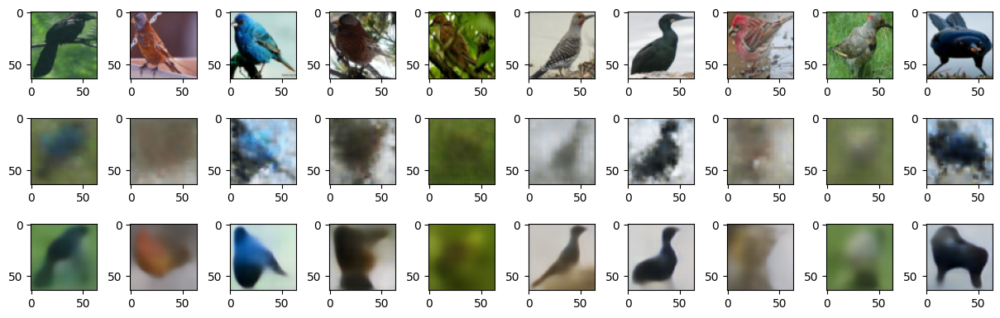

In [57]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


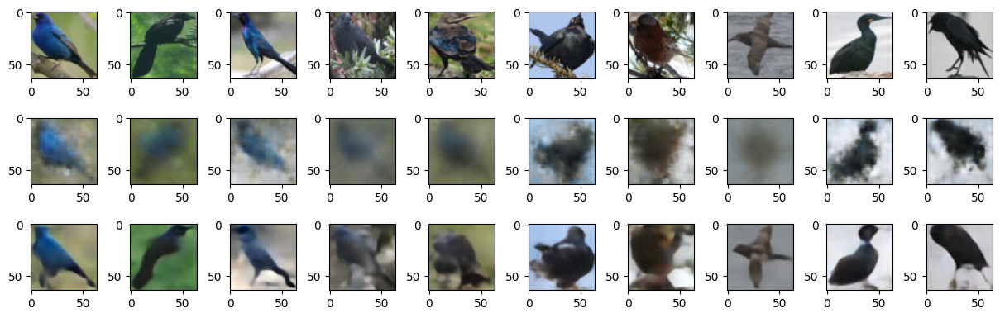

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

In [289]:
captions = []
for (i, index) in enumerate(samples):
    (modal, form) = ("B", "captions")
    indices = test_data[form][is_mm_test][index:index+1, 0].astype("int32")
    caption_recon = cub_vae({form: torch.from_numpy(indices).float()}, modal, [modal])[modal][form].argmax(-1).numpy(force = True)
    caption = torch.nn.functional.one_hot(torch.from_numpy(indices).long(), 1590)
    mm_recon = mm_cub_model.vaes[1](caption.float())[1].mean.argmax(-1).numpy(force = True)[:, 0]
    recon_arrs = [indices, caption_recon, mm_recon]
    captions.append(recon_arrs)

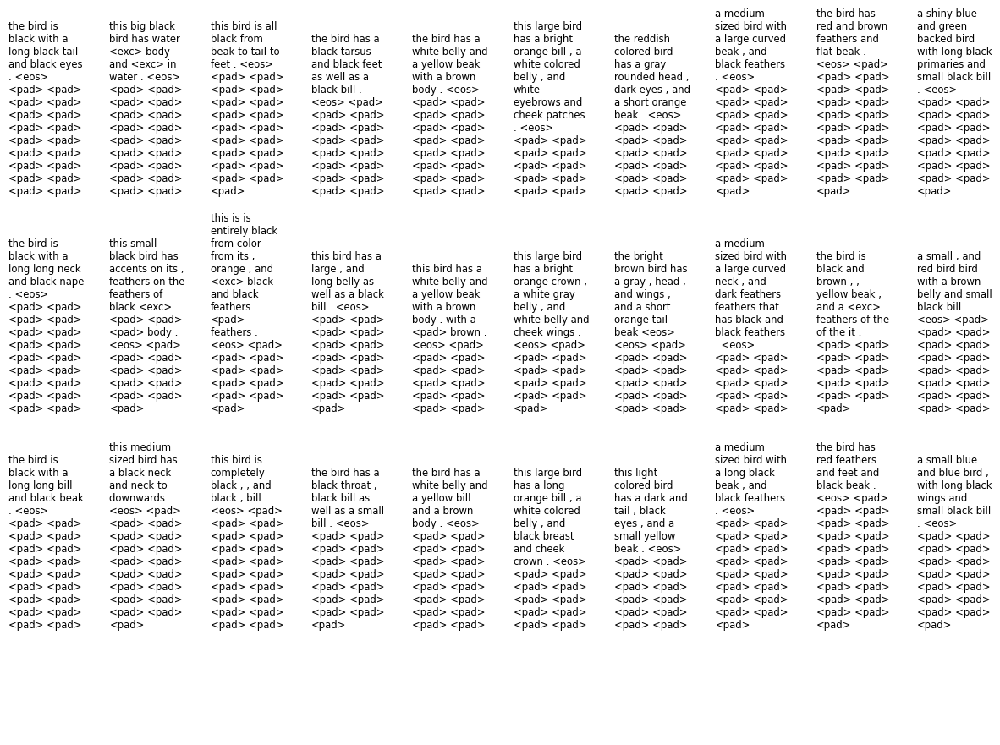

In [290]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (capt_orig, capt_recon, mm_recon)) in enumerate(captions):
    orig_text = " ".join(cub_data["vocab"][capt_orig[0].astype("int32")].tolist())
    recon_text = " ".join(cub_data["vocab"][capt_recon[0]].tolist())
    mm_recon_text = " ".join(cub_data["vocab"][mm_recon[0]].tolist())
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_mid.text(0, 0.5, recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_bottom.text(0, 0.5, mm_recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_top.axis("off")
    ax_mid.axis("off")
    ax_bottom.axis("off")
plt.show()

### Cross-modal Generation

In [365]:
images = []
((modal_1, form_1), (modal_2, form_2)) = (("A", "images"), ("B", "captions"))
img_samples = test_data[form_1][is_mm_test][0:10]
for img in img_samples:
    img = img[None]
    images.append([img])
    capt_recon = cub_vae({form_1: torch.from_numpy(img).float()}, modal_1, [modal_2])[modal_2][form_2].argmax(-1).numpy(force = True)
    input_mm_vae = mm_cub_model.vaes[0]
    output_mm_vae = mm_cub_model.vaes[1]
    mm_z = input_mm_vae(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[2][:, :, 16:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.argmax(-1).numpy(force = True)
    recon_arrs = [capt_recon, mm_recon[:, 0]]
    images[-1].extend(recon_arrs)

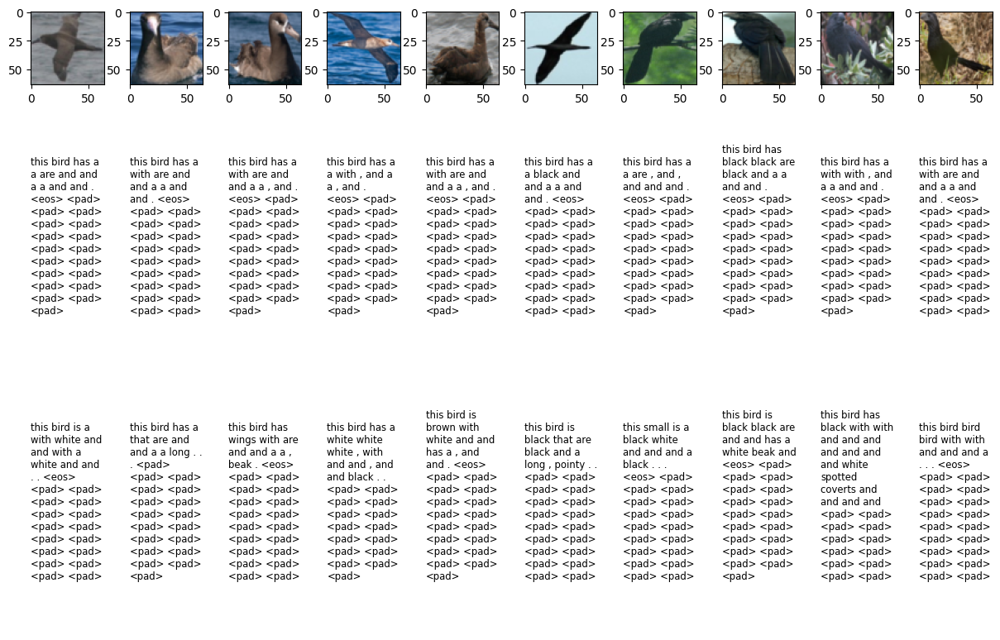

In [366]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 1.5)
for (i, (img, capt_recon, mm_recon)) in enumerate(images):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    ax_top.imshow(img[0])
    recon_text = " ".join(cub_data["vocab"][capt_recon[0]].tolist())
    mm_recon_text = " ".join(cub_data["vocab"][mm_recon[0]].tolist())
    text = ax_mid.text(0, 0.5, recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_bottom.text(0, 0.5, mm_recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.axis("off")
    ax_bottom.axis("off")
plt.show()

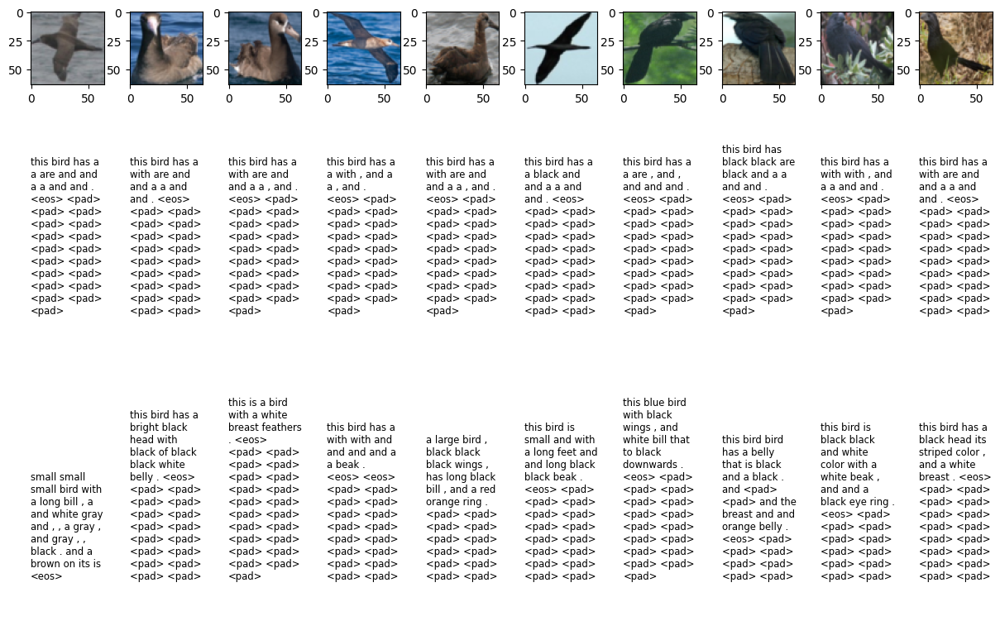

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 1.5)
for (i, (img, capt_recon, mm_recon)) in enumerate(images):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    ax_top.imshow(img[0])
    recon_text = " ".join(cub_data["vocab"][capt_recon[0]].tolist())
    mm_recon_text = " ".join(cub_data["vocab"][mm_recon[0]].tolist())
    text = ax_mid.text(0, 0.5, recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_bottom.text(0, 0.5, mm_recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.axis("off")
    ax_bottom.axis("off")
plt.show()

In [59]:
indices = []
((modal_1, form_1), (modal_2, form_2)) = (("B", "captions"), ("A", "images"))
capt_samples = test_data[form_1][is_mm_test][0:10, 0]
for index in capt_samples:
    index = index[None]
    indices.append([index])
    img_recon = cub_vae({form_1: torch.from_numpy(index).float()}, modal_1, [modal_2])[modal_2][form_2].numpy(force = True)
    input_mm_vae = mm_cub_model.vaes[1]
    output_mm_vae = mm_cub_model.vaes[0]
    caption = torch.nn.functional.one_hot(torch.from_numpy(index).long(), 1590)
    mm_z = input_mm_vae(caption.float())[2][:, :, 16:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.dec(mm_latent)[0].squeeze().permute(1, 2, 0).numpy(force = True) #output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img_recon, mm_recon[None]]
    indices[-1].extend(recon_arrs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


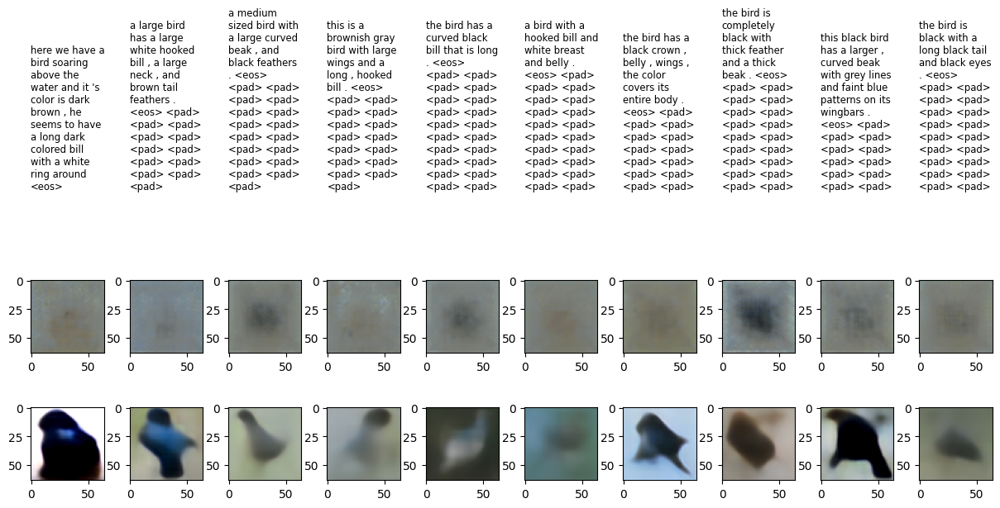

In [60]:
fig = plt.figure(figsize = (15, 6))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (index, img_recon, mm_recon)) in enumerate(indices):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    orig_text = " ".join(cub_data["vocab"][index[0].astype('int32')].tolist())
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.imshow(img_recon[0])
    ax_bottom.imshow(mm_recon[0])
    ax_top.axis("off")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


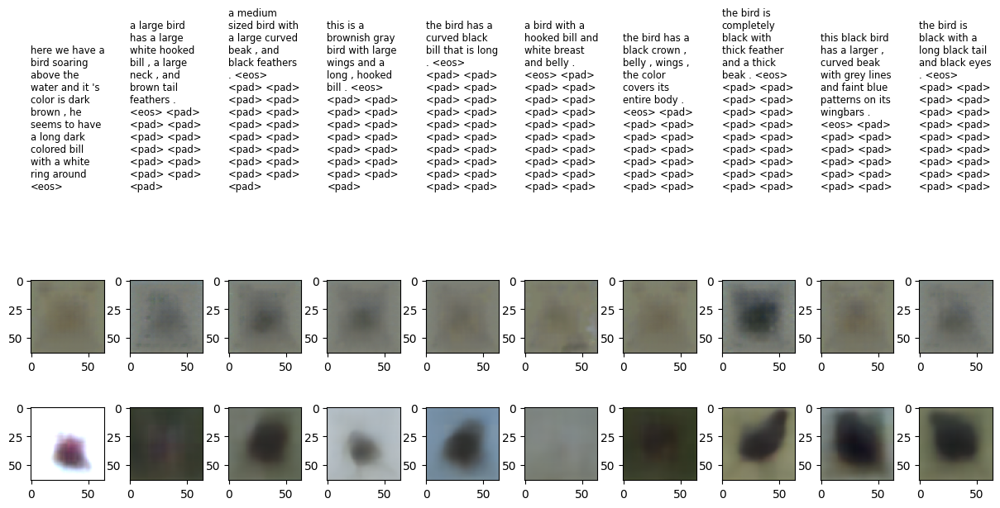

In [ ]:
fig = plt.figure(figsize = (15, 6))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (index, img_recon, mm_recon)) in enumerate(indices):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    orig_text = " ".join(cub_data["vocab"][index[0].astype('int32')].tolist())
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.imshow(img_recon[0])
    ax_bottom.imshow(mm_recon[0])
    ax_top.axis("off")
plt.show()

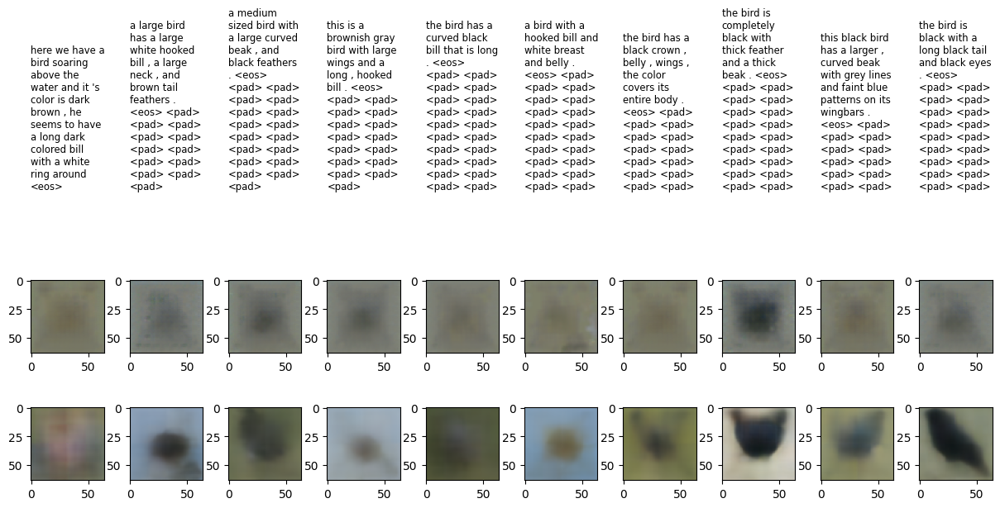

In [ ]:
fig = plt.figure(figsize = (15, 6))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (index, img_recon, mm_recon)) in enumerate(indices):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    orig_text = " ".join(cub_data["vocab"][index[0].astype('int32')].tolist())
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.imshow(img_recon[0])
    ax_bottom.imshow(mm_recon[0])
    ax_top.axis("off")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


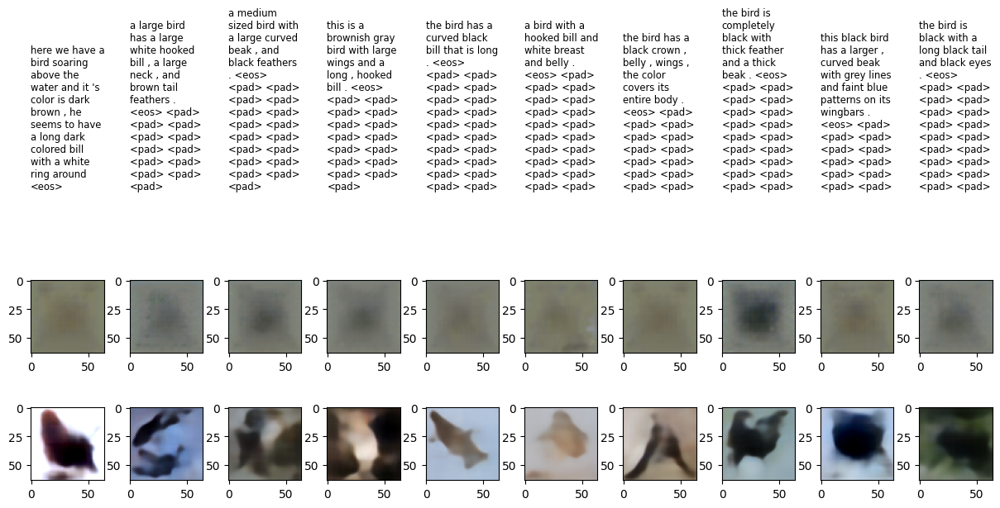

In [ ]:
fig = plt.figure(figsize = (15, 6))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (index, img_recon, mm_recon)) in enumerate(indices):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    orig_text = " ".join(cub_data["vocab"][index[0].astype('int32')].tolist())
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.imshow(img_recon[0])
    ax_bottom.imshow(mm_recon[0])
    ax_top.axis("off")
plt.show()

### Unconditional Generation

In [ ]:
sampled_z = torch.randn([10, 48])
generated = [[cub_vae.model_dict[modal]["dec"](z[None])[form].numpy(force = True) for z in sampled_z] 
             for (modal, form) in [("A", "images"), ("B", "captions")]]
grid = make_grid([torch.as_tensor(img[0]).permute(2, 0, 1) for img in generated[0]], nrow = 3).permute(1, 2, 0)
mm_grids = [arr.permute(1, 2, 0) for arr in mm_cub_model.generate_unconditional(10)]

/Users/ian.convy/code/mmvaeplus/src/utils2.py:202: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  image_tensor = torch.from_numpy(image_np).permute(2, 0, 1).float() / 255  # Normalize to [0, 1]


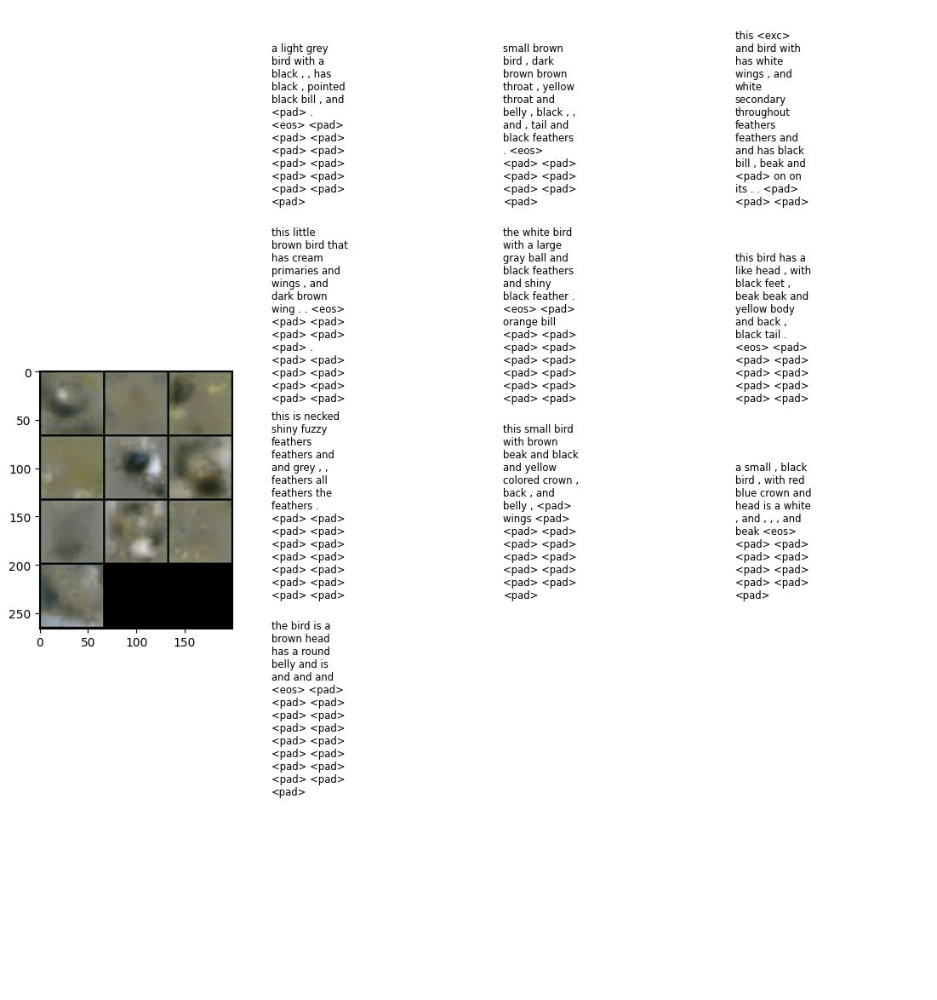

In [ ]:
fig = plt.figure(figsize = (17, 15))
grid_spec = fig.add_gridspec(4, 5, wspace = 0.2, hspace = -0.5)
fig.add_subplot(grid_spec[:, 0]).imshow(grid)
for (i, index) in enumerate(generated[1]):
    caption = " ".join(cub_data["vocab"][index.argmax(-1)][0])
    ax = fig.add_subplot(grid_spec[i // 3, 1 + i % 3])
    text = ax.text(0, 0.5, caption, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax.axis("off")
plt.show()

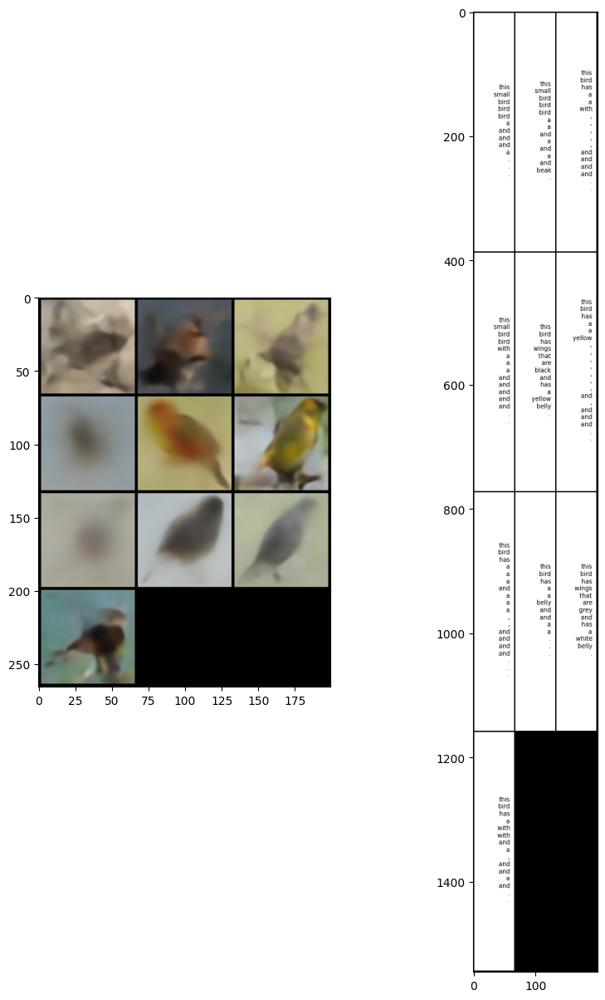

In [ ]:
fig = plt.figure(figsize = (10, 15))
grid_spec = fig.add_gridspec(1, 2, wspace = 0.2, hspace = 0.0)
for (i, img) in enumerate(mm_grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

## R2

In [15]:
cross_entropies = {"ours": [], "mmvae": []}
((modal_1, form_1), (modal_2, form_2)) = (("A", "images"), ("B", "captions"))
img_samples = test_data[form_1][is_mm_test]
index_samples = test_data[form_2][is_mm_test]
for (i, (img, indices)) in enumerate(zip(img_samples, index_samples), 1):
    print(f"Running {i} of {img_samples.shape[0]}            ", end = "\r")
    indices = indices[0]
    img = img[None]
    capt_recon = cub_vae({form_1: torch.from_numpy(img).float()}, modal_1, [modal_2])[modal_2][form_2]
    input_mm_vae = mm_cub_model.vaes[0]
    output_mm_vae = mm_cub_model.vaes[1]
    mm_z = input_mm_vae(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[2][:, :, 1:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean
    
    cross_entropies["ours"].append(torch.nn.functional.cross_entropy(capt_recon[0], torch.from_numpy(indices).long()).numpy(force = True))
    cross_entropies["mmvae"].append(torch.nn.functional.cross_entropy(mm_recon[0, 0], torch.from_numpy(indices).long()).numpy(force = True))

In [16]:
squared_errors = {"ours": [], "mmvae": []}
((modal_1, form_1), (modal_2, form_2)) = (("B", "captions"), ("A", "images"))
capt_samples = test_data[form_1][is_mm_test][:, 0]
img_samples = test_data[form_2][is_mm_test]
for (i, (img, index)) in enumerate(zip(img_samples, capt_samples), 1):
    print(f"Running {i} of {img_samples.shape[0]}            ", end = "\r")
    index = index[None]
    img_recon = cub_vae({form_1: torch.from_numpy(index).float()}, modal_1, [modal_2])[modal_2][form_2].numpy(force = True)
    input_mm_vae = mm_cub_model.vaes[1]
    output_mm_vae = mm_cub_model.vaes[0]
    caption = torch.nn.functional.one_hot(torch.from_numpy(index).long(), 1590)
    mm_z = input_mm_vae(caption.float())[2][:, :, 1:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().permute(1, 2, 0).numpy(force = True)
    squared_errors["ours"].append(np.square(img - img_recon)[0])
    squared_errors["mmvae"].append(np.square(img - mm_recon))

In [17]:
print(f"Image -> Caption: Ours = {np.mean(cross_entropies['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(cross_entropies['mmvae'], 0).sum():.4f}")
print(f"Caption -> Image: Ours = {np.mean(squared_errors['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(squared_errors['mmvae'], 0).sum():.4f}")

Image -> Caption: Ours = 2.6069 | MMVAE+ = 6.9201
Caption -> Image: Ours = 651.4406 | MMVAE+ = 1436.1486


In [ ]:
print(f"Image -> Caption: Ours = {np.mean(cross_entropies['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(cross_entropies['mmvae'], 0).sum():.4f}")
print(f"Caption -> Image: Ours = {np.mean(squared_errors['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(squared_errors['mmvae'], 0).sum():.4f}")

Image -> Caption: Ours = 2.6069 | MMVAE+ = 6.9465
Caption -> Image: Ours = 651.4406 | MMVAE+ = 1084.2592


In [ ]:
print(f"Image -> Caption: Ours = {np.mean(cross_entropies['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(cross_entropies['mmvae'], 0).sum():.4f}")
print(f"Caption -> Image: Ours = {np.mean(squared_errors['ours'], 0).sum():.4f} | MMVAE+ = {np.mean(squared_errors['mmvae'], 0).sum():.4f}")

Image -> Caption: Ours = 2.6069 | MMVAE+ = 6.9898
Caption -> Image: Ours = 651.4406 | MMVAE+ = 1422.5718


In [372]:
variances = {modal: np.nanvar(cub_data.query()[form], 0) for (modal, form) in [("A", "images"), ("B", "captions")]}

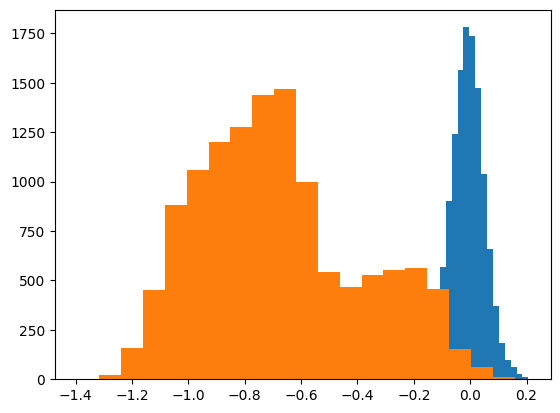

In [373]:
plt.hist(1 - (np.mean(squared_errors["ours"], 0)/variances["A"]).flatten(), 20)
plt.hist(1 - (np.mean(squared_errors["mmvae"], 0)/variances["A"]).flatten(), 20)
plt.show()

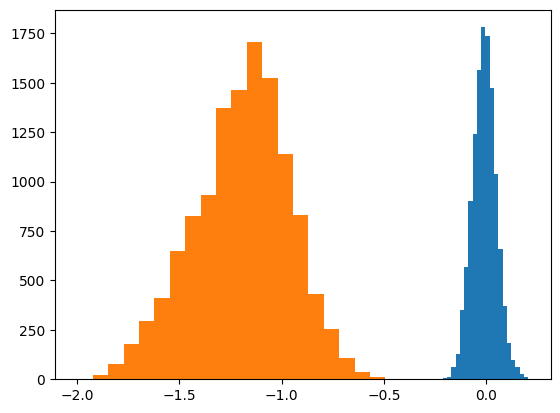

In [ ]:
plt.hist(1 - (np.mean(squared_errors["ours"], 0)/variances["A"]).flatten(), 20)
plt.hist(1 - (np.mean(squared_errors["mmvae"], 0)/variances["A"]).flatten(), 20)
plt.show()

# Improved Model

In [ ]:
polymnist_model = utils.load_jit_folds("../results/mmvae/polymnist")
cub_model = utils.load_jit_folds("../results/mmvae/cub")

## PolyMNIST

In [ ]:
fold = 1
polymnist_vae = polymnist_model["folds"][fold]["best"]
polymnist_test = polymnist_model["folds"][fold]["test_ids"]

In [ ]:
modal_maps = [("A", "m0"), ("B", "m1"), ("C", "m2"), ("D", "m3"), ("E", "m4")]
test_data = polymnist_data.get_specimens(polymnist_test)
is_mm_test = test_data["train_test"] == "test"
samples = np.random.choice(100, size = 10, replace = False)

### Reconstruction

In [ ]:
images = []
for (i, index) in enumerate(samples):
    modal_index = i % 5
    (modal, form) = modal_maps[modal_index]
    img = test_data[form][is_mm_test][index:index+1]

    (mean, transf) = polymnist_vae.model_dict[modal]["enc"]({form: torch.from_numpy(img).float()})
    z = polymnist_vae.z_sample(mean, transf, 1)[:, 0]
    z[:, -32:] = polymnist_vae.aux_sample(modal, 1)
    img_recon = polymnist_vae.model_dict[modal]["dec"](z)[form].numpy(force = True)

    mm_recon = mm_polymnist_model.vaes[modal_index](torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[1].mean.squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img, img_recon, mm_recon[None]]
    images.append(recon_arrs)
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


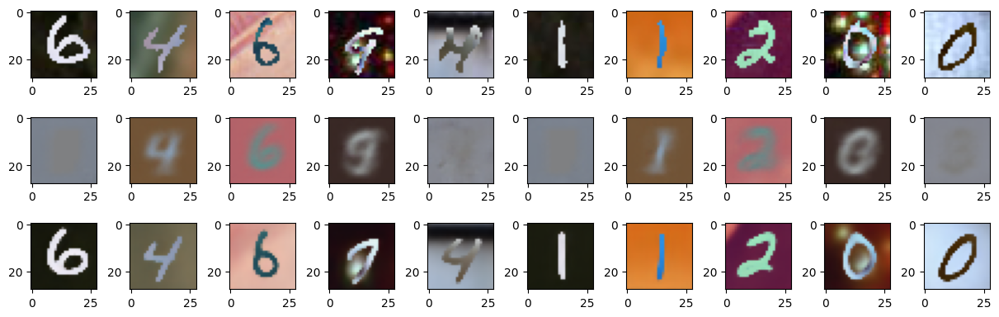

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

### Cross-modal Generation

In [ ]:
images = []
for (input_index, (modal_1, form_1)) in enumerate(modal_maps):
    img = test_data[form_1][is_mm_test][0:1]

    (mean, transf) = polymnist_vae.model_dict[modal_1]["enc"]({form_1: torch.from_numpy(img).float()})
    z = polymnist_vae.z_sample(mean, transf, 1)[:, 0]

    input_mm_vae = mm_polymnist_model.vaes[input_index]
    mm_z = input_mm_vae(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[2][:, :, 32:]
    images.append([img])
    for (output_index, (modal_2, form_2)) in enumerate(modal_maps):
        if modal_1 != modal_2:
            aux_sample = polymnist_vae.aux_sample(modal_2, 1)
            z_clone = z.clone()
            z_clone[:, -32:] = aux_sample
            img_recon = polymnist_vae.model_dict[modal_2]["dec"](z_clone)[form_2].numpy(force = True)
        
            output_mm_vae = mm_polymnist_model.vaes[output_index]
            mm_w = mm_polymnist_model.pw(*mm_polymnist_model.pw_params).sample(mm_z.shape[:2]).squeeze(2)
            mm_latent = torch.cat([mm_w, mm_z], -1)
            mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().permute(1, 2, 0).numpy(force = True)
            recon_arrs = [img_recon, mm_recon[None]]
            images[-1].append(recon_arrs)
        else:
            images[-1].append(None)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


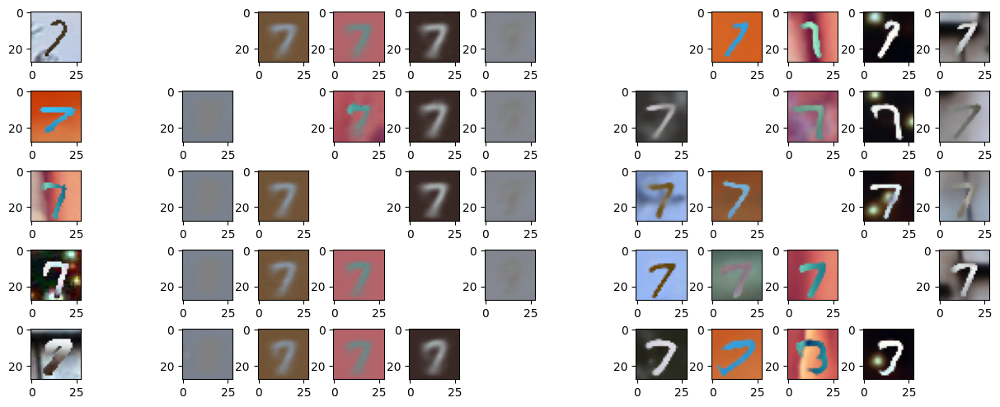

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(5, 13, wspace = 0.5, hspace = -0.75)
for (modal_1_index, modal_list) in enumerate(images):
    orig = modal_list[0]
    fig.add_subplot(grid_spec[modal_1_index, 0]).imshow(orig[0])
    for (modal_2_index, img_list) in enumerate(modal_list[1:]):
        if img_list is not None:
            (recon, mm_recon) = img_list
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2]).imshow(recon[0])
            fig.add_subplot(grid_spec[modal_1_index, modal_2_index + 2 + 6]).imshow(mm_recon[0])
plt.show()

### Unconditional Generation

In [ ]:
sampled_z = torch.randn([10, 64])
generated = [[polymnist_vae.model_dict[modal]["dec"](z[None])[form].numpy(force = True) for z in sampled_z] 
             for (modal, form) in modal_maps]
grids = [make_grid([torch.as_tensor(img[0]).permute(2, 0, 1) for img in img_list], nrow = 3).permute(1, 2, 0) for img_list in generated]
mm_grids = [arr.permute(1, 2, 0) for arr in mm_polymnist_model.generate_unconditional(10)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


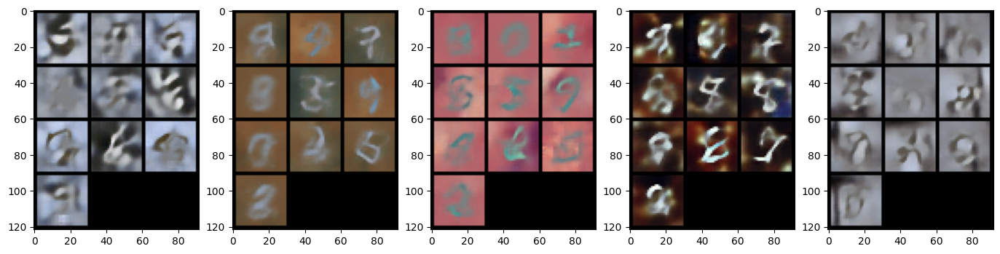

In [ ]:
fig = plt.figure(figsize = (17, 10))
grid_spec = fig.add_gridspec(1, 5, wspace = 0.2, hspace = -0.5)
for (i, img) in enumerate(grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


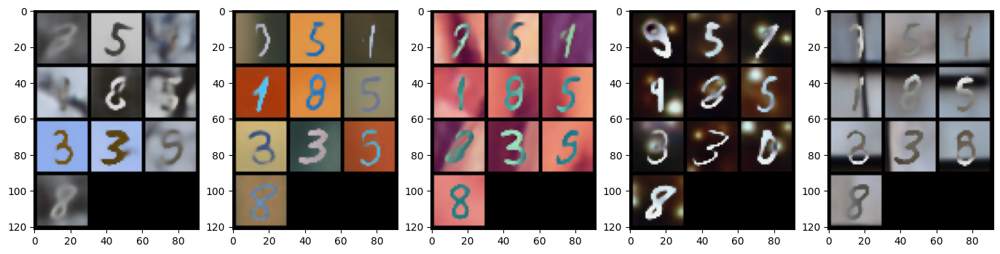

In [ ]:
fig = plt.figure(figsize = (17, 10))
grid_spec = fig.add_gridspec(1, 5, wspace = 0.2, hspace = -0.5)
for (i, img) in enumerate(mm_grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

## CUB

In [ ]:
fold = 1
cub_vae = cub_model["folds"][fold]["best"]
cub_test = cub_model["folds"][fold]["test_ids"]

In [ ]:
modal_maps = [("A", "images"), ("B", "captions")]
test_data = cub_data.get_specimens(cub_test)
is_mm_test = test_data["train_test"] == "test"
samples = np.random.choice(100, size = 10, replace = False)

### Reconstruction

In [ ]:
images = []
for (i, index) in enumerate(samples):
    (modal, form) = ("A", "images")
    img = test_data[form][is_mm_test][index:index+1]

    (mean, transf) = cub_vae.model_dict[modal]["enc"]({form: torch.from_numpy(img).float()})
    z = cub_vae.z_sample(mean, transf, 1)[:, 0]
    img_recon = cub_vae.model_dict[modal]["dec"](z)[form].numpy(force = True)

    mm_recon = mm_cub_model.vaes[0](torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[1].mean.squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img, img_recon, mm_recon[None]]
    images.append(recon_arrs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


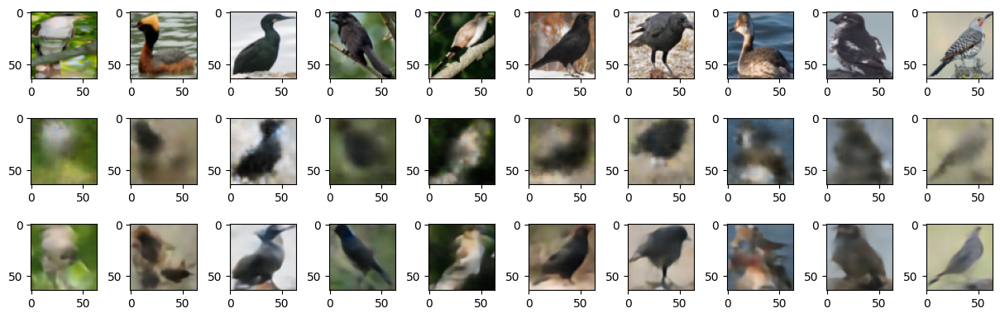

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.5, hspace = -0.75)
for (i, img_list) in enumerate(images):
    for (j, img) in enumerate(img_list):
        ax = fig.add_subplot(grid_spec[j, i])
        ax.imshow(img[0])
plt.show() 

In [ ]:
captions = []
for (i, index) in enumerate(samples):
    (modal, form) = ("B", "captions")
    indices = test_data[form][is_mm_test][index:index+1, 0].astype("int32")

    (mean, transf) = cub_vae.model_dict[modal]["enc"]({form: torch.from_numpy(indices).float()})
    z = cub_vae.z_sample(mean, transf, 1)[:, 0]

    caption = torch.nn.functional.one_hot(torch.from_numpy(indices).long(), 1590)
    mm_recon = mm_cub_model.vaes[1](caption.float())[1].mean.argmax(-1).numpy(force = True)[:, 0]
    recon_arrs = [indices, caption_recon, mm_recon]
    captions.append(recon_arrs)

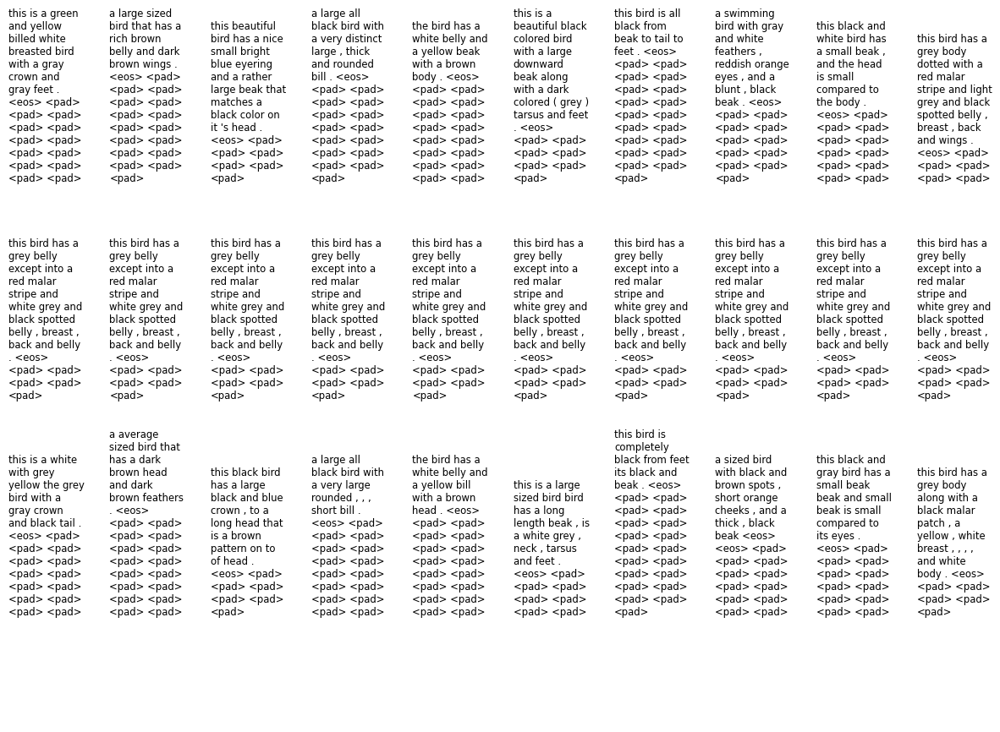

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (capt_orig, capt_recon, mm_recon)) in enumerate(captions):
    orig_text = " ".join(cub_data["vocab"][capt_orig[0].astype("int32")].tolist())
    recon_text = " ".join(cub_data["vocab"][capt_recon[0]].tolist())
    mm_recon_text = " ".join(cub_data["vocab"][mm_recon[0]].tolist())
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_mid.text(0, 0.5, recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_bottom.text(0, 0.5, mm_recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_top.axis("off")
    ax_mid.axis("off")
    ax_bottom.axis("off")
plt.show()

### Cross-modal Generation

In [ ]:
images = []
((modal_1, form_1), (modal_2, form_2)) = (("A", "images"), ("B", "captions"))
img_samples = test_data[form_1][is_mm_test][0:10]
for img in img_samples:
    img = img[None]
    images.append([img])

    (mean, transf) = cub_vae.model_dict[modal_1]["enc"]({form_1: torch.from_numpy(img).float()})
    z = cub_vae.z_sample(mean, transf, 1)[:, 0]
    aux_sample = cub_vae.aux_sample(modal_2, 1)
    z_clone = z.clone()
    z_clone[:, -16:] = aux_sample
    capt_recon = cub_vae.model_dict[modal_2]["dec"](z_clone)[form_2].argmax(-1).numpy(force = True)

    input_mm_vae = mm_cub_model.vaes[0]
    output_mm_vae = mm_cub_model.vaes[1]
    mm_z = input_mm_vae(torch.from_numpy(img).float().permute(0, 3, 1, 2).contiguous())[2][:, :, 2:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.argmax(-1).numpy(force = True)
    recon_arrs = [capt_recon, mm_recon[:, 0]]
    images[-1].extend(recon_arrs)

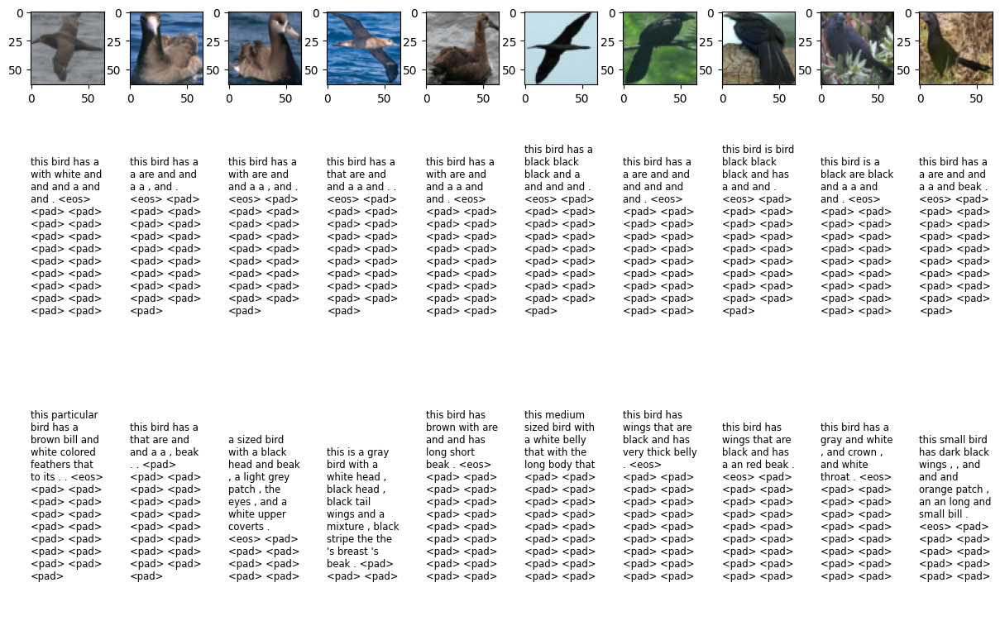

In [ ]:
fig = plt.figure(figsize = (15, 10))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 1.5)
for (i, (img, capt_recon, mm_recon)) in enumerate(images):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    ax_top.imshow(img[0])
    recon_text = " ".join(cub_data["vocab"][capt_recon[0]].tolist())
    mm_recon_text = " ".join(cub_data["vocab"][mm_recon[0]].tolist())
    text = ax_mid.text(0, 0.5, recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    text = ax_bottom.text(0, 0.5, mm_recon_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.axis("off")
    ax_bottom.axis("off")
plt.show()

In [ ]:
indices = []
((modal_1, form_1), (modal_2, form_2)) = (("B", "captions"), ("A", "images"))
capt_samples = test_data[form_1][is_mm_test][0:10, 0]
for index in capt_samples:
    index = index[None]
    indices.append([index])

    (mean, transf) = cub_vae.model_dict[modal_1]["enc"]({form_1: torch.from_numpy(index).float()})
    z = cub_vae.z_sample(mean, transf, 1)[:, 0]
    aux_sample = cub_vae.aux_sample(modal_2, 1)
    z_clone = z.clone()
    z_clone[:, -16:] = aux_sample
    img_recon = cub_vae.model_dict[modal_2]["dec"](z_clone)[form_2].numpy(force = True)

    input_mm_vae = mm_cub_model.vaes[1]
    output_mm_vae = mm_cub_model.vaes[0]
    caption = torch.nn.functional.one_hot(torch.from_numpy(index).long(), 1590)
    mm_z = input_mm_vae(caption.float())[2][:, :, 2:]
    mm_w = mm_cub_model.pw(*mm_cub_model.pw_params).sample(mm_z.shape[:1])
    mm_latent = torch.cat([mm_w, mm_z], -1)
    mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().permute(1, 2, 0).numpy(force = True)
    recon_arrs = [img_recon, mm_recon[None]]
    indices[-1].extend(recon_arrs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


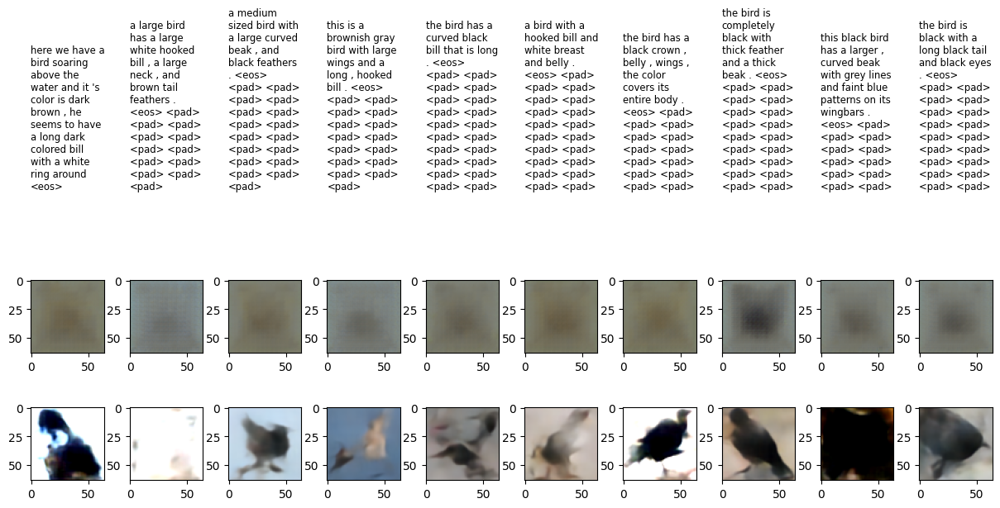

In [ ]:
fig = plt.figure(figsize = (15, 6))
grid_spec = fig.add_gridspec(3, 10, wspace = 0.35, hspace = 0.0)
for (i, (index, img_recon, mm_recon)) in enumerate(indices):
    ax_top = fig.add_subplot(grid_spec[0, i])
    ax_mid = fig.add_subplot(grid_spec[1, i])
    ax_bottom = fig.add_subplot(grid_spec[2, i])
    orig_text = " ".join(cub_data["vocab"][index[0].astype('int32')].tolist())
    text = ax_top.text(0, 0.5, orig_text, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax_mid.imshow(img_recon[0])
    ax_bottom.imshow(mm_recon[0])
    ax_top.axis("off")
plt.show()

### Unconditional Generation

In [ ]:
sampled_z = torch.randn([10, 64])
generated = [[cub_vae.model_dict[modal]["dec"](z[None])[form].numpy(force = True) for z in sampled_z] 
             for (modal, form) in [("A", "images"), ("B", "captions")]]
grid = make_grid([torch.as_tensor(img[0]).permute(2, 0, 1) for img in generated[0]], nrow = 3).permute(1, 2, 0)
mm_grids = [arr.permute(1, 2, 0) for arr in mm_cub_model.generate_unconditional(10)]

/Users/ian.convy/code/mmvaeplus/src/utils2.py:202: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  image_tensor = torch.from_numpy(image_np).permute(2, 0, 1).float() / 255  # Normalize to [0, 1]


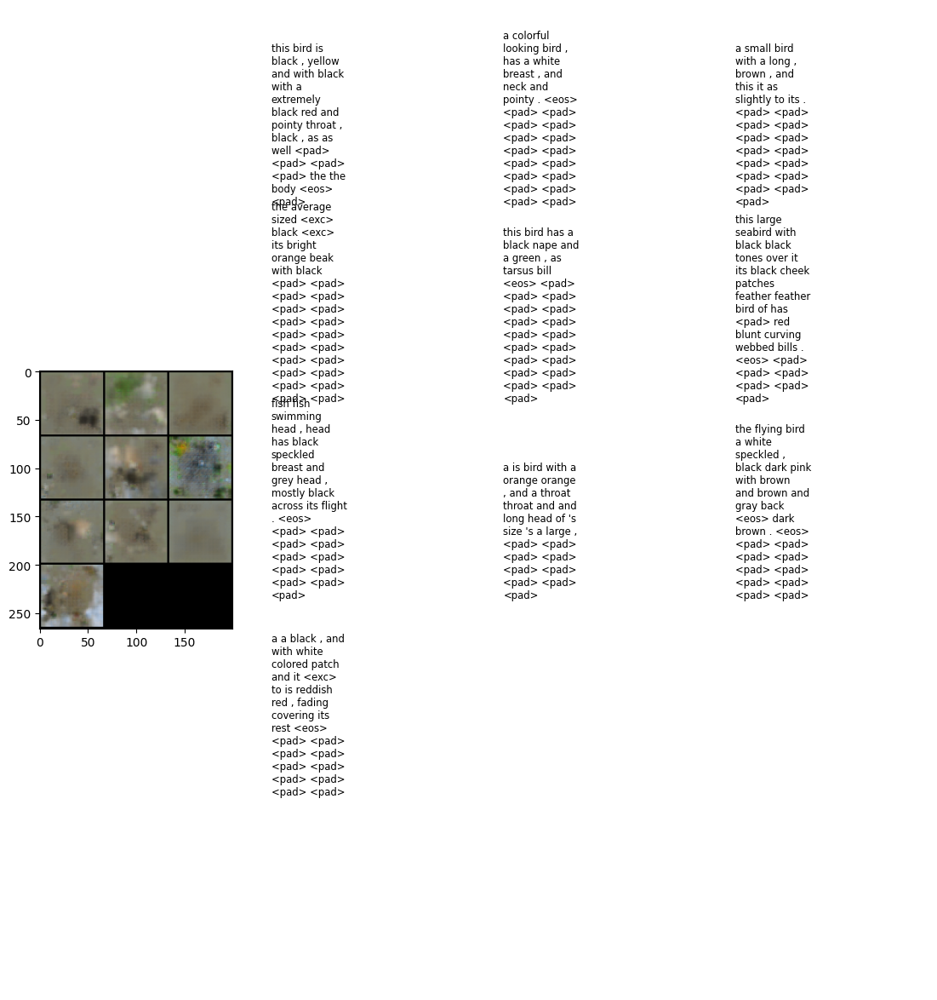

In [ ]:
fig = plt.figure(figsize = (17, 15))
grid_spec = fig.add_gridspec(4, 5, wspace = 0.2, hspace = -0.5)
fig.add_subplot(grid_spec[:, 0]).imshow(grid)
for (i, index) in enumerate(generated[1]):
    caption = " ".join(cub_data["vocab"][index.argmax(-1)][0])
    ax = fig.add_subplot(grid_spec[i // 3, 1 + i % 3])
    text = ax.text(0, 0.5, caption, fontsize = "small", wrap = True)
    text._get_wrap_line_width = lambda : 90.
    ax.axis("off")
plt.show()

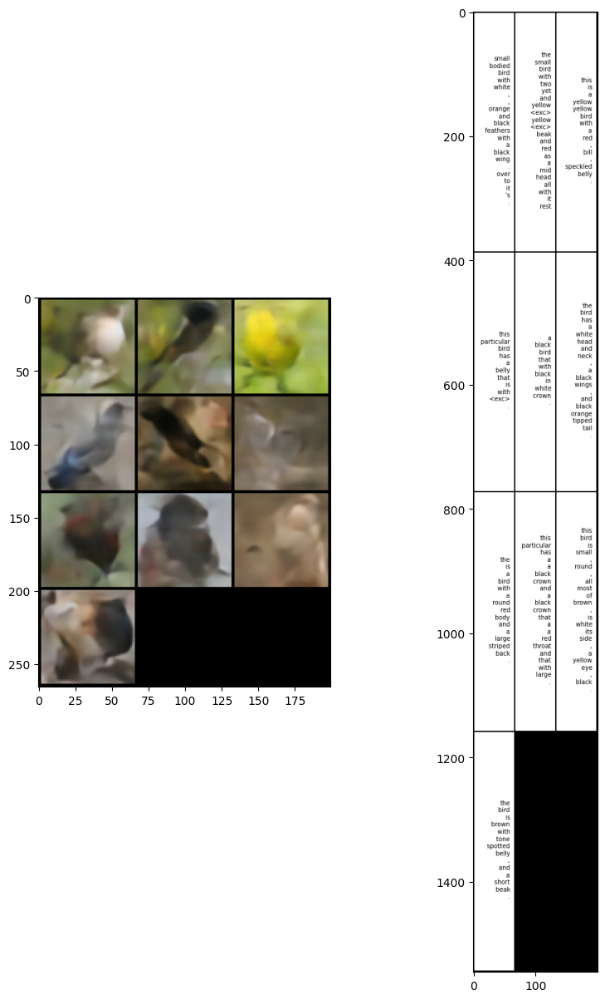

In [ ]:
fig = plt.figure(figsize = (10, 15))
grid_spec = fig.add_gridspec(1, 2, wspace = 0.2, hspace = 0.0)
for (i, img) in enumerate(mm_grids):
    ax = fig.add_subplot(grid_spec[0, i])
    ax.imshow(img)
plt.show()

# Patch-seq

In [243]:
modal_maps = [("T", "logcpm"), ("E", "pca-ipfx")]
met_data = MET_Data("../data/neurons.hdf5", **{"logcpm": "logcpm", "pca-ipfx": "pca-ipfx", "arbors": "arbors"})

In [ ]:
patch_model = utils.load_jit_folds("../results/baselines/t_e_arms_10")
patch_vaes = {fold: info["best"] for (fold, info) in patch_model["folds"].items()}

In [ ]:
mm_models = {}
for fold in range(1, 11):
    mm_patch_path = f"/Users/ian.convy/code/mmvaeplus/outputs/Patch_fold_{fold}/checkpoints/5_5_1.0_2/model_1000.rar"
    mm_patch_args = torch.load(f"/Users/ian.convy/code/mmvaeplus/outputs/Patch_fold_{fold}/checkpoints/5_5_1.0_2/args.rar")
    mm_patch_model = models.MMVAEplus_Patch(mm_patch_args)
    mm_patch_model.load_state_dict(torch.load(mm_patch_path, map_location = torch.device("cpu")))
    mm_models[fold] = mm_patch_model.eval()

In [ ]:
variances = {modal: np.nanvar(met_data.query(formats = [("logcpm", "pca-ipfx", "arbors")])[form], 0) for (modal, form) in [("T", "logcpm"), ("E", "pca-ipfx")]}

In [258]:
squared_errors = {}
neigbor_samples = {form: met_data.query(formats = [(form,)], outputs = [form])[form] for form in ["logcpm", "pca-ipfx"]}
for fold in range(1, 11):
    test_ids = patch_model["folds"][fold]["test_ids"]
    test_data = met_data.query(test_ids, formats = [("logcpm", "pca-ipfx", "arbors")])
    patch_vae = patch_vaes[fold]
    mm_patch_model = mm_models[fold]
    for i in range(test_data["logcpm"].shape[0]):
        print(f"Running {i + 1} of {test_data['logcpm'].shape[0]}            ", end = "\r")
        for (input_index, (modal_1, form_1)) in enumerate(modal_maps):
            arr = test_data[form_1][i:i+1]
            input_mm_vae = mm_patch_model.vaes[input_index]
            mm_z = input_mm_vae(torch.from_numpy(arr).float())[2][..., 5:]
            recons = patch_vae({form_1: torch.from_numpy(arr).float()}, modal_1, [modal for (modal, _) in modal_maps])
            for (output_index, (modal_2, form_2)) in enumerate(modal_maps):
                arr_test = test_data[form_2][i:i+1]
                output_mm_vae = mm_patch_model.vaes[output_index]
                mm_w = mm_patch_model.pw(*mm_patch_model.pw_params).mean[None]#.sample(mm_z.shape[:2]).squeeze(2)
                mm_latent = torch.cat([mm_w, mm_z], -1)
                mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().numpy(force = True)
                recon = recons[modal_2][form_2].numpy(force = True)
                arr_error = np.square(arr_test - recon)[0]
                mm_error = np.square(arr_test - mm_recon)[0]
                squared_errors.setdefault("ours", {}).setdefault(modal_1, {}).setdefault(modal_2, {}).setdefault(fold, []).append(arr_error)
                squared_errors.setdefault("mmvae", {}).setdefault(modal_1, {}).setdefault(modal_2, {}).setdefault(fold, []).append(mm_error)

In [260]:
mean_errors = squared_errors.copy()
for (model, model_dict) in squared_errors.items():
    for (modal_1, modal_dict) in model_dict.items():
        for (modal_2, fold_dict) in modal_dict.items():
            mean_errors[model][modal_1][modal_2]= np.mean([np.mean(sq_list, 0) for sq_list in fold_dict.values()], 0)

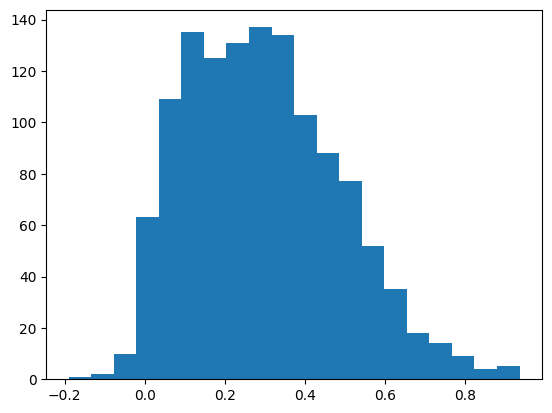

In [262]:
plt.hist(1 - mean_errors["ours"]["E"]["T"]/variances["T"], 20)
plt.show()

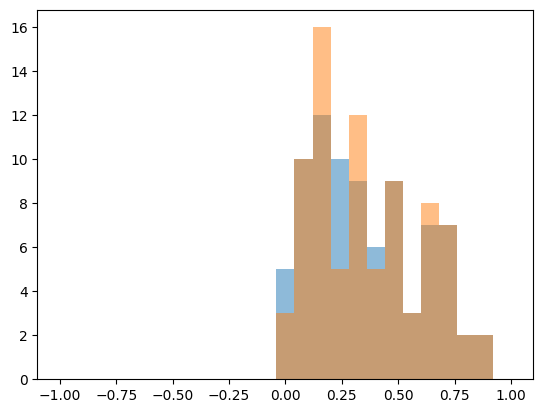

In [269]:
plt.hist(1 - mean_errors["ours"]["T"]["E"]/variances["E"], 25, alpha = 0.5, range = (-1, 1))
plt.hist(1 - mean_errors["mmvae"]["T"]["E"]/variances["E"], 25, alpha = 0.5, range = (-1, 1))
plt.show()

In [239]:
1 - mean_errors["ours"]["E"]["T"].sum()/variances["T"].sum()

0.08430178891646445

In [240]:
1 - mean_errors["mmvae"]["E"]["T"].sum()/variances["T"].sum()

0.3656233838085995

In [ ]:
mean_errors["mmvae"]["E"]["T"]

array([1.00315538, 0.80951737, 0.85491078, ..., 2.26677209, 2.67755006,
       1.06931686])

In [ ]:
squared_errors = {}
for fold in range(1, 11):
    test_ids = patch_model["folds"][fold]["test_ids"]
    test_data = met_data.query(test_ids, formats = [("logcpm", "pca-ipfx", "arbors")])
    patch_vae = patch_vaes[fold]
    mm_patch_model = mm_models[fold]
    for i in range(test_data["logcpm"].shape[0]):
        print(f"Running {i + 1} of {test_data['logcpm'].shape[0]}            ", end = "\r")
        for (input_index, (modal_1, form_1)) in enumerate(modal_maps):
            arr = test_data[form_1][i:i+1]
            input_mm_vae = mm_patch_model.vaes[input_index]
            mm_z = input_mm_vae(torch.from_numpy(arr).float())[2][..., 5:]
            recons = patch_vae({form_1: torch.from_numpy(arr).float()}, modal_1, [modal for (modal, _) in modal_maps])
            for (output_index, (modal_2, form_2)) in enumerate(modal_maps):
                arr_test = test_data[form_2][i:i+1]
                output_mm_vae = mm_patch_model.vaes[output_index]
                mm_w = mm_patch_model.pw(*mm_patch_model.pw_params).mean[None]#.sample(mm_z.shape[:2]).squeeze(2)
                mm_latent = torch.cat([mm_w, mm_z], -1)
                mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().numpy(force = True)
                mm_sqe = np.square(arr_test - mm_recon).sum()
                squared_errors.setdefault("mmvae", {}).setdefault(modal_1, {}).setdefault(modal_2, {}).setdefault(fold, []).append(mm_sqe)
                recon = recons[modal_2][form_2].numpy(force = True)
                arr_sqe = np.square(arr_test - recon).sum()
                squared_errors.setdefault("ours", {}).setdefault(modal_1, {}).setdefault(modal_2, {}).setdefault(fold, []).append(arr_sqe)
mean_errors = squared_errors.copy()
for (model, model_dict) in squared_errors.items():
    for (modal_1, modal_dict) in model_dict.items():
        for (modal_2, fold_dict) in modal_dict.items():
            for (fold, sq_list) in fold_dict.items():
                mean_errors[model][modal_1][modal_2][fold] = np.mean(sq_list)
for (modal_1, modal_dict) in mean_errors["ours"].items():
    for (modal_2, fold_means) in modal_dict.items():
        our_mean = np.mean(list(fold_means.values()))
        mmvae_mean = np.mean(list(mean_errors["mmvae"][modal_1][modal_2].values()))
        var = variances[modal_2].sum()
        print(f"{modal_1} -> {modal_2}: Ours = {1 - our_mean/var:.4f} | MMVAE+ = {1 - mmvae_mean/var:.4f}")

T -> T: Ours = 0.4707 | MMVAE+ = 0.1566
T -> E: Ours = 0.4889 | MMVAE+ = 0.5023
E -> T: Ours = 0.3656 | MMVAE+ = 0.0840
E -> E: Ours = 0.8504 | MMVAE+ = 0.5236


## Classifier

In [ ]:
merge_map = utils.get_tree_merge_map("../data/meta/tree_Mouse_ALM-VISp_2018.csv", "n4")
num_merges = len(next(iter(merge_map.values())))
merge_list = list(range(0, num_merges - 1, 2))
mappers = {merge: np.vectorize(lambda elem,merge=merge: merge_map[elem][merge]) 
           for merge in range(num_merges - 1)}
valid_clusters = list(merge_map.keys())

In [ ]:
specimen_types = met_data.query(formats = [("logcpm", "pca-ipfx")], outputs = ["specimen_id", "cluster_label"])
specimens = specimen_types["specimen_id"]
train_ids = specimens[~np.isin(specimens, test_ids) & np.isin(np.char.strip(specimen_types["cluster_label"]), valid_clusters)]

In [234]:
tree_accs = {}
tree_models = {form: {merge: LogisticRegression(max_iter = 1000) for merge in merge_list} 
          for form in ["logcpm", "pca-ipfx"]}
for (form, merge_trees) in tree_models.items():
    train_data = met_data.query(train_ids, outputs = [form, "cluster_label"])
    test_data = met_data.query(test_ids, formats = [("logcpm", "pca-ipfx", "arbors")], outputs = [form, "cluster_label"])
    for merge in merge_list:
        tree = merge_trees[merge]
        (X_train, y_train) = (train_data[form], mappers[merge](np.char.strip(train_data["cluster_label"])))
        (X_test, y_test) = (test_data[form], mappers[merge](np.char.strip(test_data["cluster_label"])))
        tree.fit(X_train, y_train)
        tree_accs.setdefault(form, {})[merge] = tree.score(X_test, y_test)
        print(f"{form} - {merge}         ", end = "\r")

/Users/ian.convy/miniconda3/envs/cpl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


/Users/ian.convy/miniconda3/envs/cpl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


/Users/ian.convy/miniconda3/envs/cpl/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KeyboardInterrupt: 

In [ ]:
modal_maps = [("T", "logcpm"), ("E", "pca-ipfx")]
(patch_accs, mmvae_accs) = ({}, {})
for fold in range(1, 11):
    test_ids = patch_model["folds"][fold]["test_ids"]
    test_data = met_data.query(test_ids, formats = [("logcpm", "pca-ipfx", "arbors")])
    patch_vae = patch_vaes[fold]
    mm_patch_model = mm_models[fold]
    all_y = np.char.strip(test_data["cluster_label"])
    for i in range(test_data["logcpm"].shape[0]):
        print(f"Running {i + 1} of {test_data['logcpm'].shape[0]}            ", end = "\r")
        y = all_y[i:i+1]
        if y[0] in valid_clusters:
            for (input_index, (modal_1, form_1)) in enumerate(modal_maps):
                arr = test_data[form_1][i:i+1]
                input_mm_vae = mm_patch_model.vaes[input_index]
                mm_z = input_mm_vae(torch.from_numpy(arr).float())[2][..., 5:]
                for (output_index, (modal_2, form_2)) in enumerate(modal_maps):
                    if modal_1 != modal_2:
                        output_mm_vae = mm_patch_model.vaes[output_index]
                        mm_w = mm_patch_model.pw(*mm_patch_model.pw_params).mean[None]#.sample(mm_z.shape[:2]).squeeze(2)
                        mm_latent = torch.cat([mm_w, mm_z], -1)
                        mm_recon = output_mm_vae.px_u(*output_mm_vae.dec(mm_latent)).mean.squeeze().numpy(force = True)
                        recon = patch_vae({form_1: torch.from_numpy(arr).float()}, modal_1, [modal_2])[modal_2][form_2].numpy(force = True)
                        for merge in merge_list:
                            mapped_y = mappers[merge](y)
                            patch_accs.setdefault(form_2, {}).setdefault(merge, {}).setdefault(fold, []).append(tree_models[form_2][merge].score(recon, mapped_y))
                            mmvae_accs.setdefault(form_2, {}).setdefault(merge, {}).setdefault(fold, []).append(tree_models[form_2][merge].score(mm_recon[None], mapped_y))

In [ ]:
(mmvae_scores, patch_scores) = (mmvae_accs.copy(), patch_accs.copy())
for (form, form_dict) in mmvae_scores.items():
    for (merge, merge_dict) in form_dict.items():
        mmvae_scores[form][merge] = np.mean([np.mean(samples) for samples in merge_dict.values()])
        patch_scores[form][merge] = np.mean([np.mean(samples) for samples in patch_accs[form][merge].values()])            

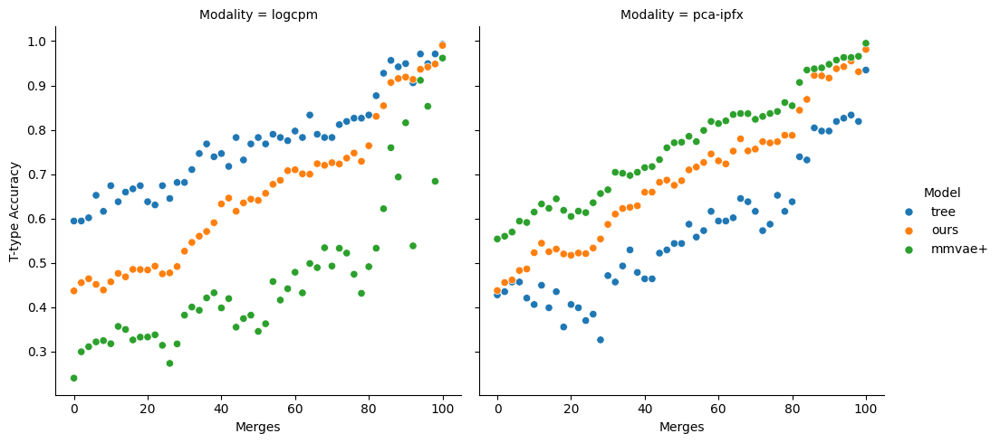

In [ ]:
plot_data = {}
for (model, accs) in [("tree", tree_accs), ("ours", patch_scores), ("mmvae+", mmvae_scores)]:
    for (form, form_dict) in accs.items():
        for (merge, acc) in form_dict.items():
            plot_data.setdefault("Model", []).append(model)
            plot_data.setdefault("Modality", []).append(form)
            plot_data.setdefault("Merges", []).append(merge)
            plot_data.setdefault("T-type Accuracy", []).append(acc)
sns.relplot(data = plot_data, x = "Merges", y = "T-type Accuracy", hue = "Model", col = "Modality")
plt.show()

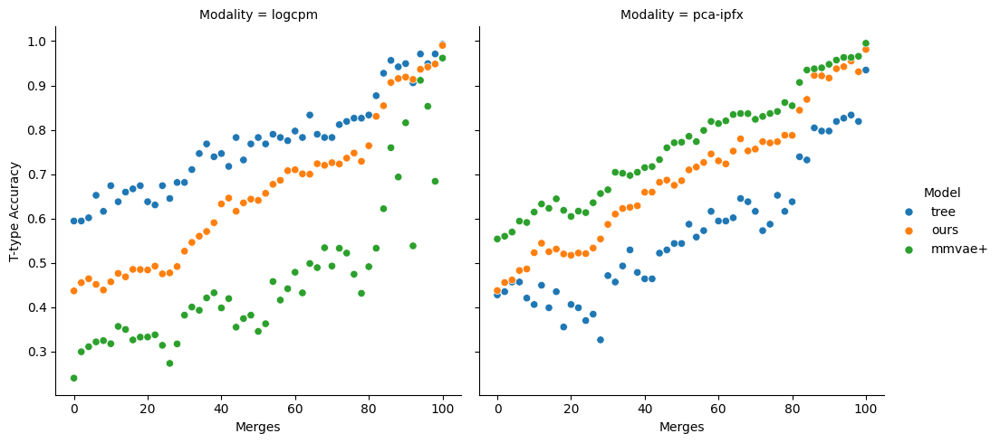

In [ ]:
plot_data = {}
for (model, accs) in [("tree", tree_accs), ("ours", patch_scores), ("mmvae+", mmvae_scores)]:
    for (form, form_dict) in accs.items():
        for (merge, acc) in form_dict.items():
            plot_data.setdefault("Model", []).append(model)
            plot_data.setdefault("Modality", []).append(form)
            plot_data.setdefault("Merges", []).append(merge)
            plot_data.setdefault("T-type Accuracy", []).append(acc)
sns.relplot(data = plot_data, x = "Merges", y = "T-type Accuracy", hue = "Model", col = "Modality")
plt.show()

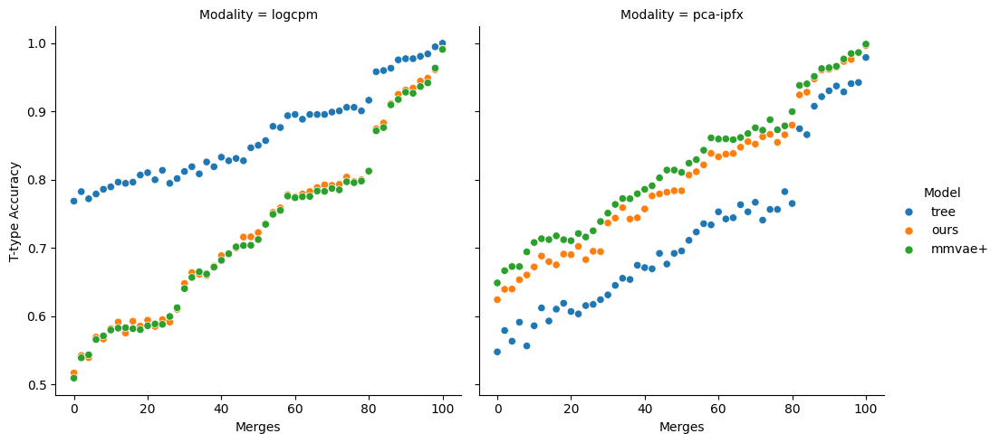

In [ ]:
plot_data = {}
for (model, accs) in [("tree", tree_accs), ("ours", patch_scores), ("mmvae+", mmvae_scores)]:
    for (form, form_dict) in accs.items():
        for (merge, acc) in form_dict.items():
            plot_data.setdefault("Model", []).append(model)
            plot_data.setdefault("Modality", []).append(form)
            plot_data.setdefault("Merges", []).append(merge)
            plot_data.setdefault("T-type Accuracy", []).append(acc)
sns.relplot(data = plot_data, x = "Merges", y = "T-type Accuracy", hue = "Model", col = "Modality")
plt.show()